# Breast Cancer Wisconsin Data Visualization

Introduzione

Importazione Dataset 

In [109]:
from sklearn import datasets
from sklearn.datasets import load_breast_cancer
data, target = load_breast_cancer(return_X_y=True, as_frame=True)
data.insert(0, 'Type', target)
labels = data.columns

importazione librerie

In [110]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
import seaborn as sns
from sklearn import preprocessing
import numpy as np
import math

Parallel Plot: per avere una prima visione della distribuzione dei dati

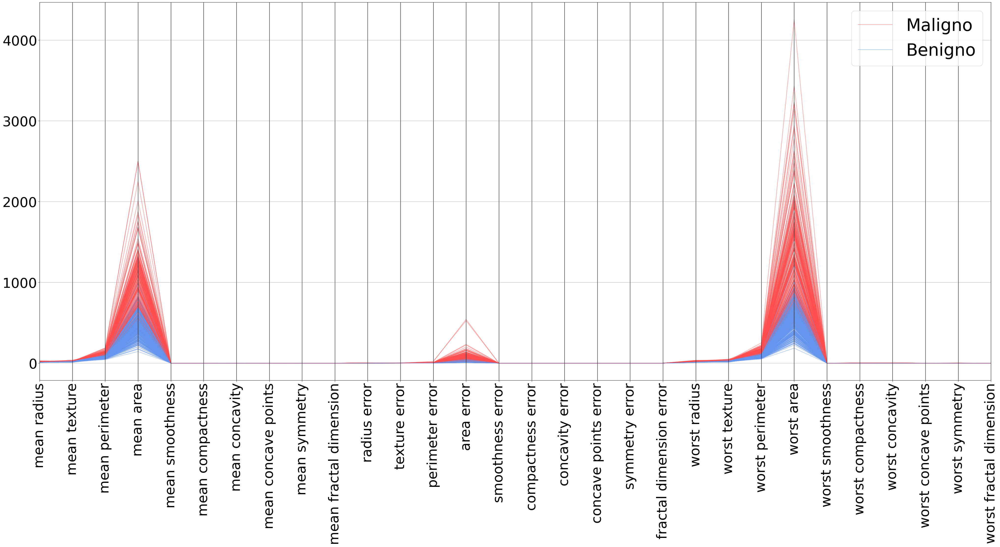

In [68]:
pd.plotting.parallel_coordinates(data, 'Type', 
                                 color=['#ff4d4d', '#6495ed'], alpha=0.5
                                )
plt.rc('figure', figsize=(50.0, 30.0))
plt.xticks(rotation=90)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
L=plt.legend(fontsize=50)
L.get_texts()[0].set_text('Maligno')
L.get_texts()[1].set_text('Benigno')

plt.show()

Osservazione: nel grafico si nota subito come le scale degli attributi siano troppo diverse per comparare i dati senza normalizzazione

Normalizzazione dei dati

In [10]:
scaler = preprocessing.MinMaxScaler()

colms = data.columns 
np_scaled = scaler.fit_transform(data) 
data_norm = pd.DataFrame(np_scaled, columns = colms) 

Parallel plot normalizzato

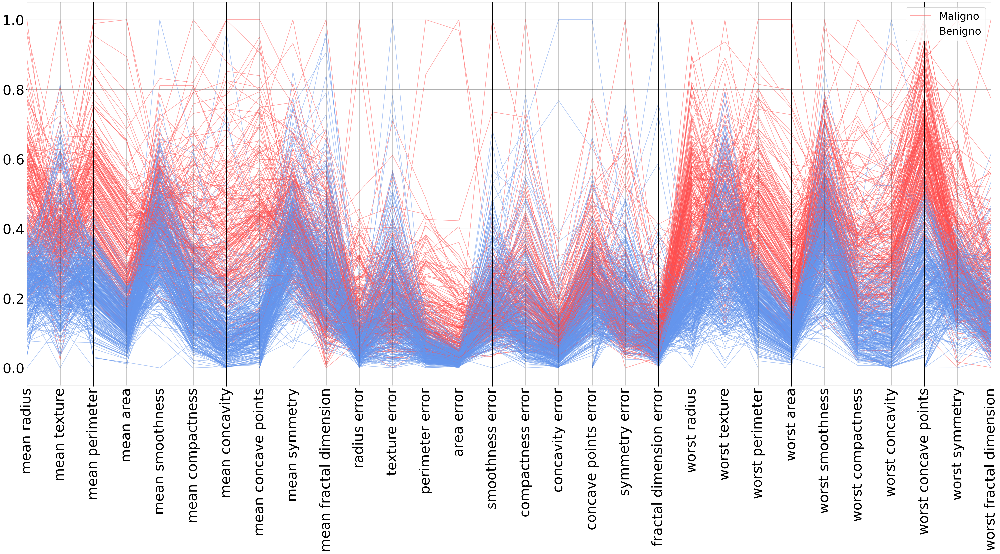

In [67]:
pd.plotting.parallel_coordinates(data_norm, 'Type', 
                                 color=['#ff4d4d', '#6495ed'], alpha=0.5
                                )
plt.rc('figure', figsize=(50.0, 20.0))
plt.xticks(rotation=90)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
L=plt.legend(fontsize=30,  loc='upper right')
L.get_texts()[0].set_text('Maligno')
L.get_texts()[1].set_text('Benigno')

plt.show()

Conclusione: dal grafico normalizzato non si notano attributi più rilevanti di altri.

Dividiamo il dataset in mean e worst e successivamente normalizziamo

In [19]:
id = list(data.index)
data_mean = data.iloc[id, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
data_worst = data.iloc[id, [0, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]]

In [20]:
scaler = preprocessing.MinMaxScaler()

colms = data_mean.columns
np_scaled = scaler.fit_transform(data_mean)
mean_norm = pd.DataFrame(np_scaled, columns = colms)

colms = data_worst.columns
np_scaled = scaler.fit_transform(data_worst)
worst_norm = pd.DataFrame(np_scaled, columns = colms)

Studiamo la correlazione tra attributi

Matrice di correlazione

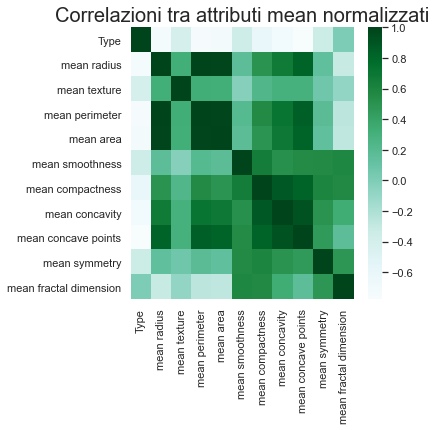

In [21]:
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(mean_norm.corr(), cmap='BuGn').set_title("Correlazioni tra attributi mean normalizzati", size= 20)
plt.show()

OSSERVAZIONE: dalla matrice di correlazione si nota come mean perimeter e mean area siano notevolmente correlati con mean radius.

In [64]:
def pltcolor(classe):
    cols=[]
    for c in classe:
        if c==0:
            cols.append('#ff4d4d')
        else:
            cols.append('#6495ed')
    return cols

cols=pltcolor(list(target))

Scatter Plot degli attributi correlati

Text(0, 0.5, 'mean area')

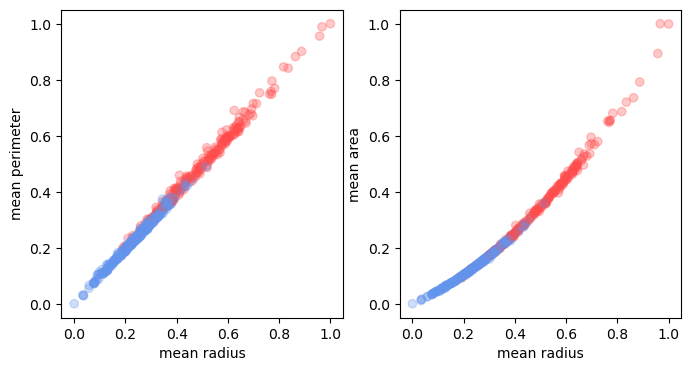

In [65]:
plt.style.use('default')
fig , axs = plt.subplots( nrows=1, ncols=2, figsize= (8,4))

axs[0].scatter("mean radius", "mean perimeter", data=mean_norm, c=cols, alpha=0.3)
axs[0].set_xlabel('mean radius')
axs[0].set_ylabel('mean perimeter')

axs[1].scatter("mean radius", "mean area", data=mean_norm, c=cols, alpha=0.3)
axs[1].set_xlabel('mean radius')
axs[1].set_ylabel('mean area')

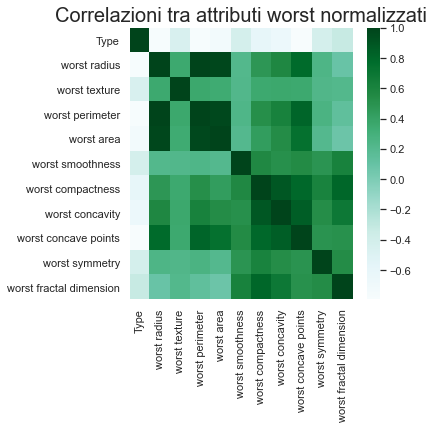

In [22]:
#matrice di correlazione sul dataset con solo i worst per vedere se ci sono delle differenze con quella mean
sns.set(rc={'figure.figsize':(5,5)})

sns.heatmap(worst_norm.corr(), cmap='BuGn').set_title("Correlazioni tra attributi worst normalizzati", size= 20)
plt.show()

STRIPPLOT E BOX PLOT: fatti per visualizzare la distribuzione dei pazienti per gli attributi

In [72]:
colors=['#ff4d4d' , '#6495ed']

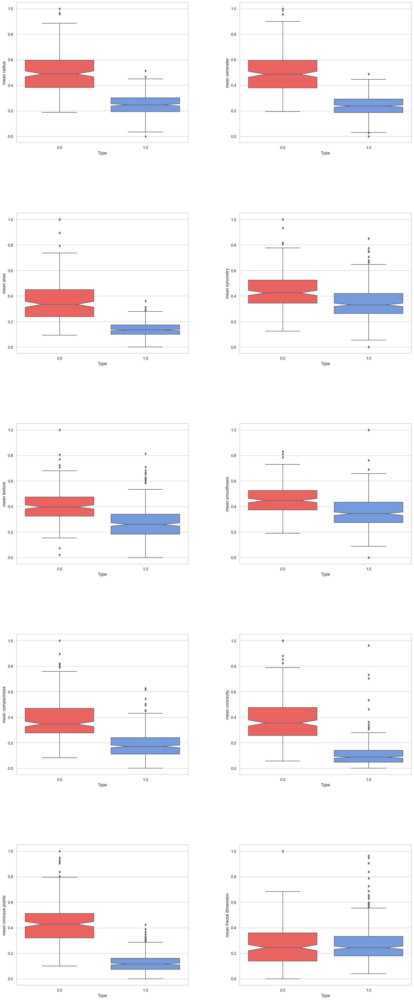

In [63]:
sns.set()
#plt.style.use('default')
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(5, 2, figsize=(20, 50))

sns.boxplot(ax=axes[0, 0], data=data_norm, x='Type', y='mean radius', palette=colors, notch=True)
sns.boxplot(ax=axes[0, 1], data=data_norm, x='Type', y='mean perimeter', palette=colors, notch=True)
sns.boxplot(ax=axes[1, 0], data=data_norm, x='Type', y='mean area', palette=colors, notch=True)
sns.boxplot(ax=axes[1, 1], data=data_norm, x='Type', y='mean symmetry', palette=colors, notch=True)
sns.boxplot(ax=axes[2, 0], data=data_norm, x='Type', y='mean texture', palette=colors, notch=True)
sns.boxplot(ax=axes[2, 1], data=data_norm, x='Type', y='mean smoothness', palette=colors, notch=True)
sns.boxplot(ax=axes[3, 0], data=data_norm, x='Type', y='mean compactness', palette=colors, notch=True)
sns.boxplot(ax=axes[3, 1], data=data_norm, x='Type', y='mean concavity', palette=colors, notch=True)
sns.boxplot(ax=axes[4, 0], data=data_norm, x='Type', y='mean concave points', palette=colors, notch=True)
sns.boxplot(ax=axes[4, 1], data=data_norm, x='Type', y='mean fractal dimension', palette=colors, notch=True)

fig.subplots_adjust(wspace=0.3, hspace=0.5)

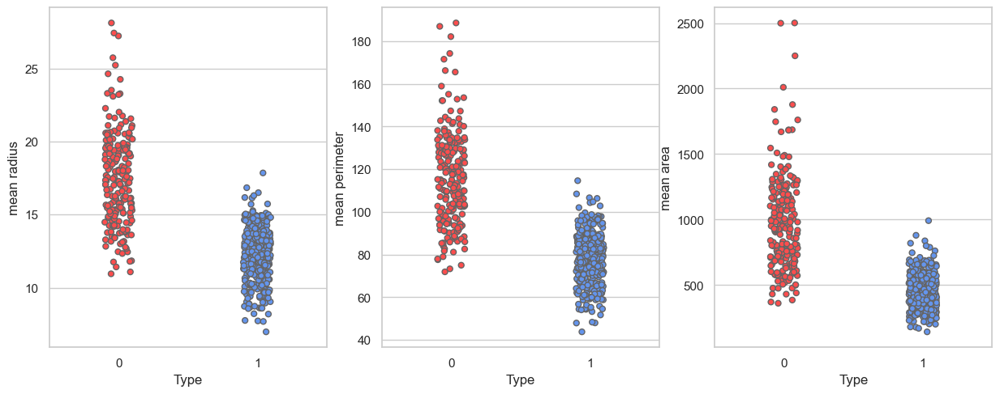

In [75]:

sns.set_theme(style="whitegrid")
plt.rc('figure', figsize=(15.0, 12.0))
plt.subplot(2,3,1)
sns.stripplot(x='Type', y='mean radius', data=data, linewidth=1, palette=colors)


plt.subplot(2,3,2)
sns.set_theme(style="whitegrid")
sns.stripplot(x='Type', y='mean perimeter', data=data, linewidth=1, palette= colors)


plt.subplot(2,3,3)
sns.set_theme(style="whitegrid")
sns.stripplot(x='Type', y='mean area', data=data, linewidth=1, palette= colors)

plt.show()

SOVRAPPOSIZIONE BOXPLOT E STRIPPLOT

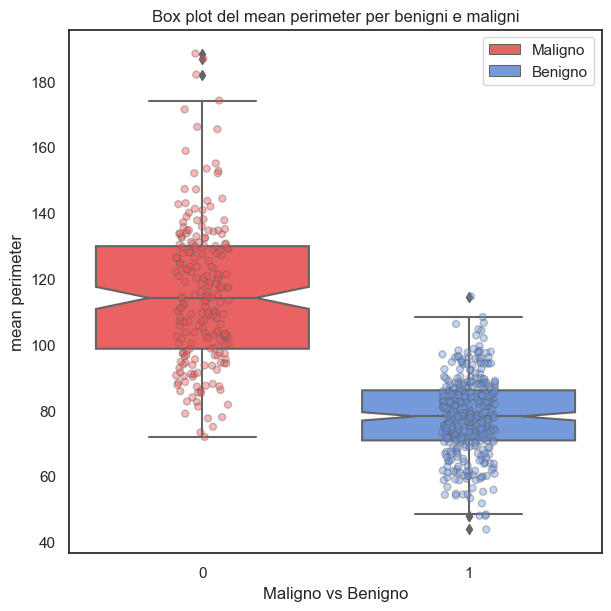

In [104]:
fig=plt.figure(figsize=[6, 6], constrained_layout=True)
sns.set_theme(style="white")
plt.title("Box plot del mean perimeter per benigni e maligni")
sns.boxplot(data=data, x='Type', y='mean perimeter', palette=colors, notch=True, hue='Type', dodge=False)
sns.stripplot(x='Type', y='mean perimeter', data=data, linewidth=1, palette= colors, alpha=0.4)
plt.xlabel("Maligno vs Benigno")
L=plt.legend()
L.get_texts()[0].set_text('Maligno')
L.get_texts()[1].set_text('Benigno')
plt.show()

Perimetro/2Pi vs Raggio
dividiamo il dataset tra pazienti benigni e maligni

In [77]:
pazienti_maligni = data_mean.loc[data_mean['Type'] == 0]
pazienti_benigni = data_mean.loc[data_mean['Type'] == 1]

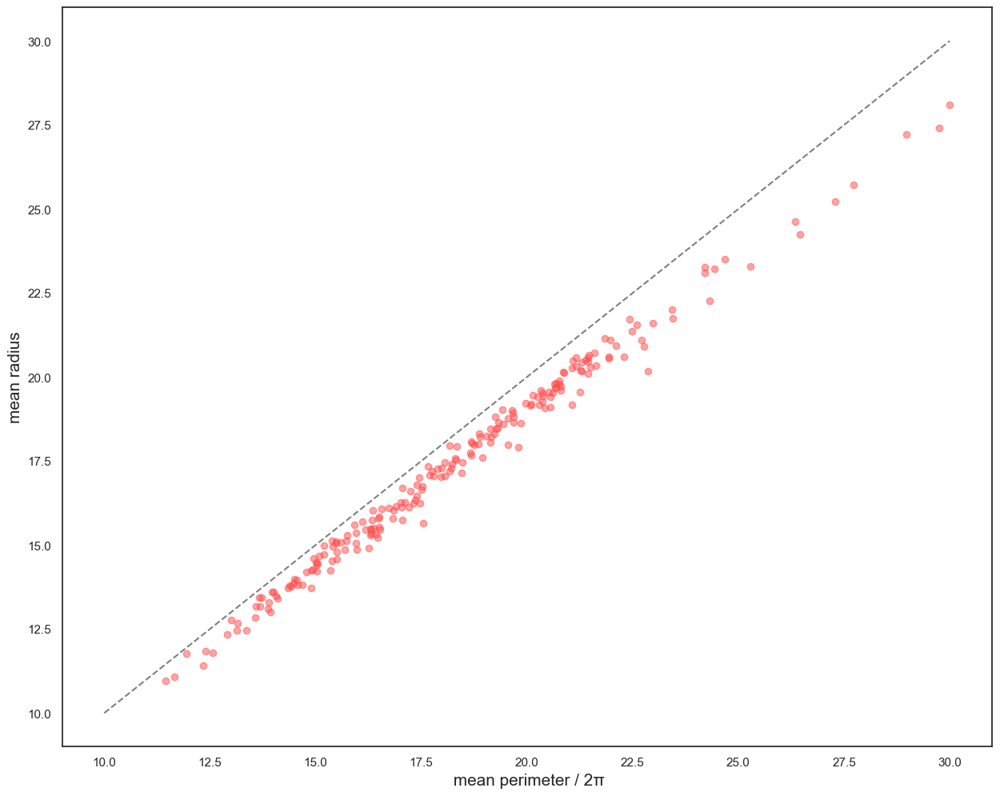

In [94]:
xi=10
xf=30
yi=10
yf=30

pr=[]
for x in pazienti_maligni['mean perimeter']:
    pr.append(x/(2*math.pi))
pr1=pd.Series(pr)

fig=plt.figure(figsize=[8, 8], constrained_layout=True)
plt.scatter(pr, pazienti_maligni['mean radius'], color='#ff4d4d', alpha=0.5)
plt.plot([xi,xf],[yi,yf], color='gray', linestyle='dashed')
plt.xlabel(' mean perimeter / 2π', size=15)
plt.ylabel('mean radius', size=15)
plt.show()

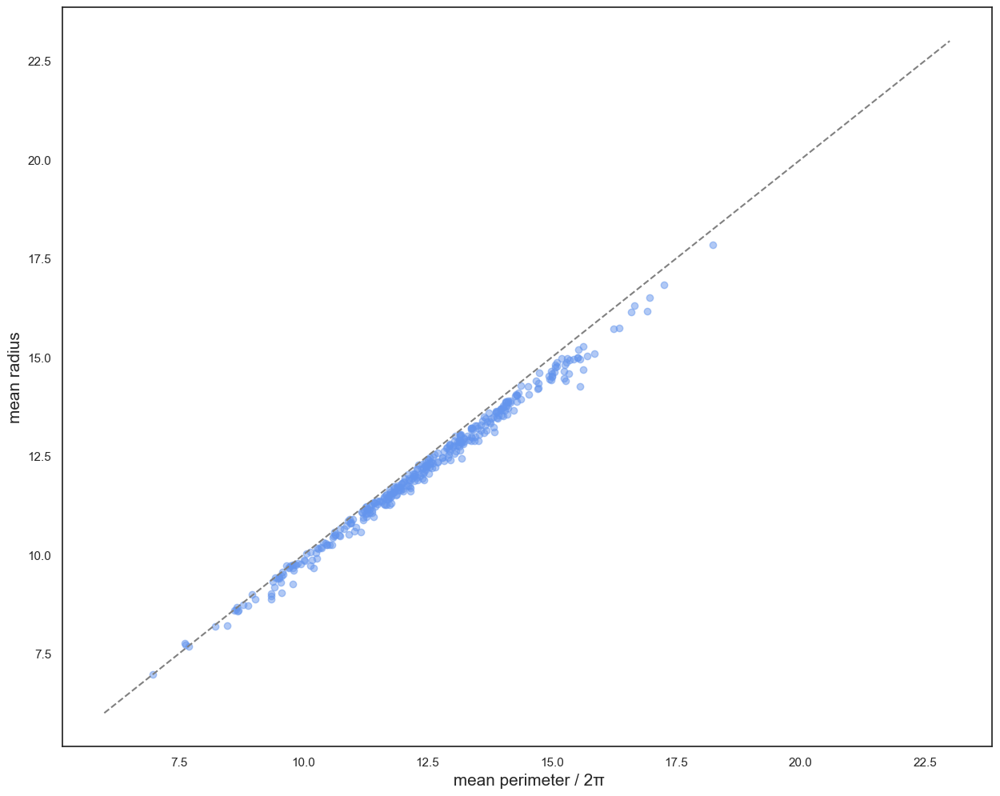

In [102]:
x0=6
x1=23
y0=6
y1=23

prb=[]
for x in pazienti_benigni['mean perimeter']:
    prb.append(x/(2*math.pi))

fig=plt.figure(figsize=[8, 8], constrained_layout=True)
plt.scatter(prb, pazienti_benigni['mean radius'], color='#6495ed', alpha=0.5)
plt.plot([x0,x1],[y0,y1], color='gray', linestyle='dashed')
plt.xlabel(' mean perimeter / 2π', size=15)
plt.ylabel('mean radius', size=15)
plt.show()

PAZIENTE MEDIO BENIGNO

In [118]:
pazienti_benigni_1 = data.loc[data['Type'] == 1]
pazienti_maligni_1 = data.loc[data['Type'] == 0]

In [119]:
paziente_benigno_medio_dataframe=pd.DataFrame(columns = labels)
paziente_benigno_medio_lista =[]
for i in labels:
    att=list(pazienti_benigni_1[i])
    paziente_benigno_medio_lista.append((sum(att)/len(att)))

paziente_benigno_medio_serie= pd.Series(data=paziente_benigno_medio_lista, index=labels)

paziente_benigno_medio_dataframe = paziente_benigno_medio_dataframe.append(paziente_benigno_medio_serie, ignore_index=True)

PAZIENTE MEDIO MALIGNO

In [120]:
paziente_maligno_medio_dataframe=pd.DataFrame(columns = labels)
paziente_maligno_medio_lista =[]
for i in labels:
    att=list(pazienti_maligni_1[i])
    paziente_maligno_medio_lista.append((sum(att)/len(att)))

paziente_maligno_medio_serie= pd.Series(data=paziente_maligno_medio_lista, index=labels)

paziente_maligno_medio_dataframe = paziente_maligno_medio_dataframe.append(paziente_maligno_medio_serie, ignore_index=True)

PAZIENTI NORMALIZZATI

In [121]:
pazienti_benigni_norm = pd.DataFrame(columns = labels)
for i in data_norm.index:
    if target[i]==1:
        pazienti_benigni_norm=pazienti_benigni_norm.append(data_norm.loc[i], ignore_index=True)

        
pazienti_maligni_norm = pd.DataFrame(columns = labels)
for i in data_norm.index:
    if target[i]==0:
        pazienti_maligni_norm=pazienti_maligni_norm.append(data_norm.loc[i], ignore_index=True)


In [122]:
#isolo i dati degli errori
error_benigni = pazienti_benigni_norm.iloc[list(pazienti_benigni_norm.index), [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]]
error_maligni = pazienti_maligni_norm.iloc[list(pazienti_maligni_norm.index), [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]]

In [123]:
mse_error_benigni_list = []
somma = 0

for i in error_benigni.columns:
    errori = list(error_benigni[i])
    for x in errori:
        quadrato = x*x
        somma += quadrato
    mse_error_benigni_list.append(math.sqrt(somma)/len(errori))

In [124]:
mse_error_maligni_list = []
somma = 0

for i in error_maligni.columns:
    errori = list(error_maligni[i])
    for x in errori:
        quadrato = x*x
        somma += quadrato
    mse_error_maligni_list.append(math.sqrt(somma)/len(errori))

Benigno MEDIO normalizzato

In [128]:
paziente_benigno_medio_lista_norm =[]
for i in labels:
    att=list(pazienti_benigni_norm[i])
    paziente_benigno_medio_lista_norm.append((sum(att)/len(att)))

paziente_benigno_medio_serie_norm= pd.Series(data=paziente_benigno_medio_lista_norm, index=labels)
#paziente_benigno_medio_serie_norm

In [129]:
paziente_benigno_medio_serie_norm[11] = mse_error_benigni_list[0]

paziente_benigno_medio_serie_norm[12] = mse_error_benigni_list[1]

paziente_benigno_medio_serie_norm[13] = mse_error_benigni_list[2]

paziente_benigno_medio_serie_norm[14] = mse_error_benigni_list[3]

paziente_benigno_medio_serie_norm[15] = mse_error_benigni_list[4]

paziente_benigno_medio_serie_norm[16] = mse_error_benigni_list[5]

paziente_benigno_medio_serie_norm[17] = mse_error_benigni_list[6]

paziente_benigno_medio_serie_norm[18] = mse_error_benigni_list[7]

paziente_benigno_medio_serie_norm[19] = mse_error_benigni_list[8]

paziente_benigno_medio_serie_norm[20] = mse_error_benigni_list[9]


paziente_benigno_medio_dataframe_norm=pd.DataFrame(columns = labels)
paziente_benigno_medio_dataframe_norm = paziente_benigno_medio_dataframe_norm.append(paziente_benigno_medio_serie_norm, ignore_index=True)
paziente_benigno_medio_lista_norm = list(paziente_benigno_medio_serie_norm)

PAZIENTE MEDIO MALIGNO NORMALIZZATO

In [125]:
paziente_maligno_medio_lista_norm =[]
for i in labels:
    att=list(pazienti_maligni_norm[i])
    paziente_maligno_medio_lista_norm.append((sum(att)/len(att)))

paziente_maligno_medio_serie_norm= pd.Series(data=paziente_maligno_medio_lista_norm, index=labels)

In [126]:
paziente_maligno_medio_serie_norm[11] = mse_error_maligni_list[0]

paziente_maligno_medio_serie_norm[12] = mse_error_maligni_list[1]

paziente_maligno_medio_serie_norm[13] = mse_error_maligni_list[2]

paziente_maligno_medio_serie_norm[14] = mse_error_maligni_list[3]

paziente_maligno_medio_serie_norm[15] = mse_error_maligni_list[4]

paziente_maligno_medio_serie_norm[16] = mse_error_maligni_list[5]

paziente_maligno_medio_serie_norm[17] = mse_error_maligni_list[6]

paziente_maligno_medio_serie_norm[18] = mse_error_maligni_list[7]

paziente_maligno_medio_serie_norm[19] = mse_error_maligni_list[8]

paziente_maligno_medio_serie_norm[20] = mse_error_maligni_list[9]


paziente_maligno_medio_dataframe_norm=pd.DataFrame(columns = labels)
paziente_maligno_medio_dataframe_norm = paziente_maligno_medio_dataframe_norm.append(paziente_maligno_medio_serie_norm, ignore_index=True)
paziente_maligno_medio_lista_norm = list(paziente_maligno_medio_serie_norm)

In [130]:
maligno_mean= paziente_maligno_medio_lista_norm[1:11]
benigno_mean= paziente_benigno_medio_lista_norm[1:11]

meligno_worst= paziente_maligno_medio_lista_norm[21:31]
benigno_worst= paziente_benigno_medio_lista_norm[21:31]

labels_mean=labels[1:11]
labels_worst=labels[21:31]

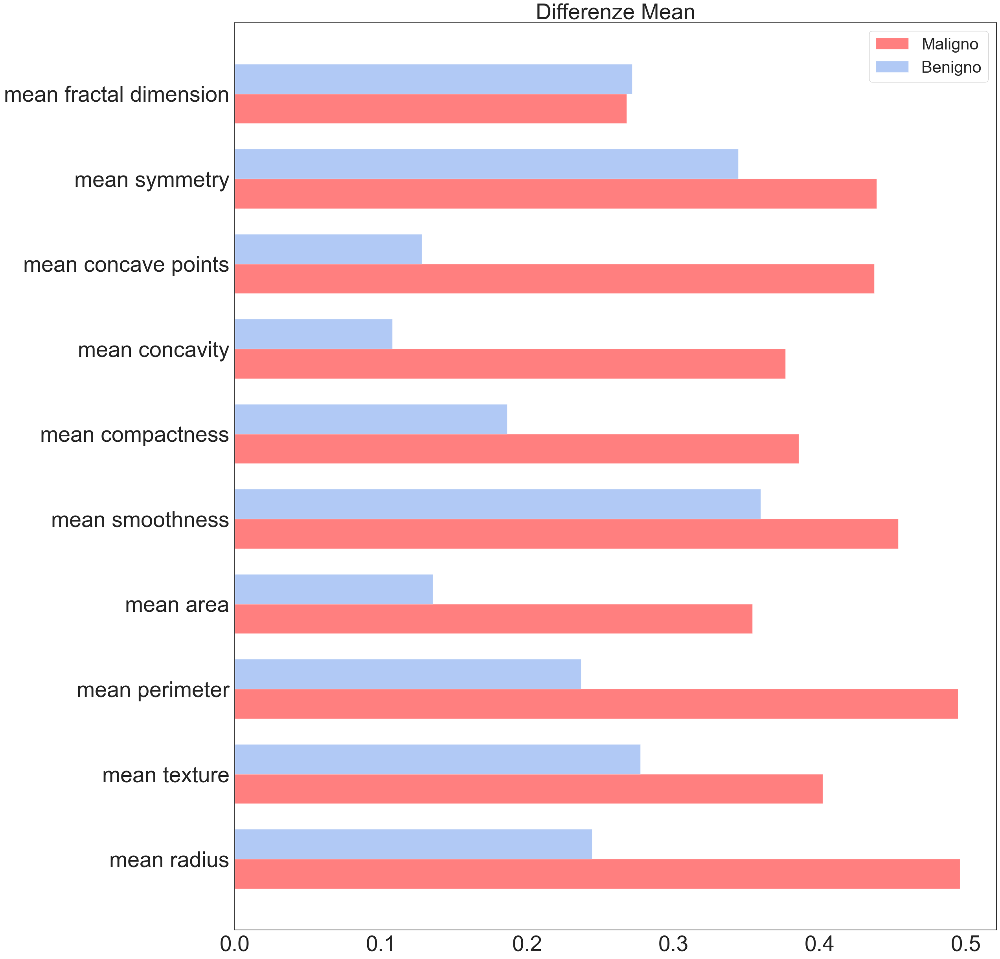

In [131]:
plt.rc('figure', figsize=(25.0, 30.0))

x = np.arange(len(labels_mean))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.barh(x - width/2, maligno_mean, width, label='Maligno', alpha=0.5, color='red')
rects2 = ax.barh(x + width/2, benigno_mean, width, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Mean', size=40)
ax.set_yticks(x)
ax.set_yticklabels(labels_mean)
ax.legend()
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=30)

plt.show()

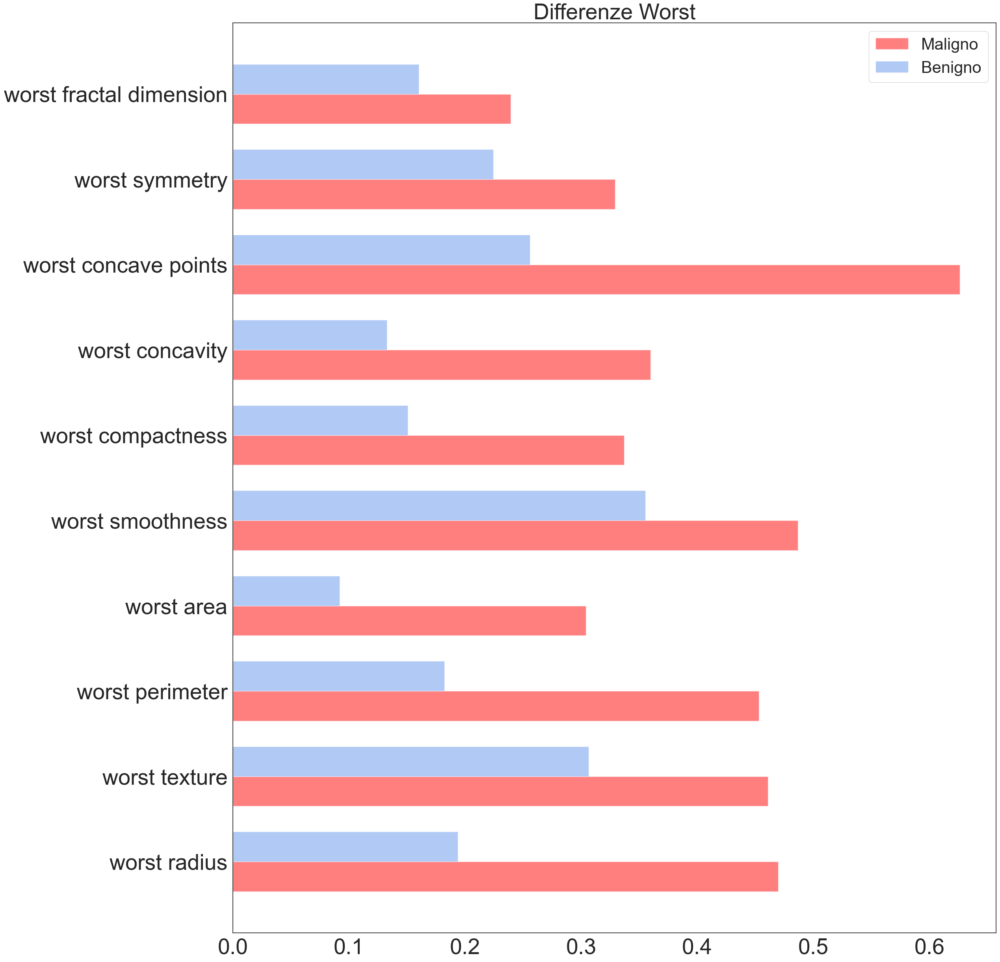

In [132]:
plt.rc('figure', figsize=(25.0, 30.0))

x = np.arange(len(labels_worst))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.barh(x - width/2, meligno_worst, width, label='Maligno', alpha=0.5, color='red')
rects2 = ax.barh(x + width/2, benigno_worst, width, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Worst', size=40)
ax.set_yticks(x)
ax.set_yticklabels(labels_worst)
ax.legend()
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=30)

plt.show()

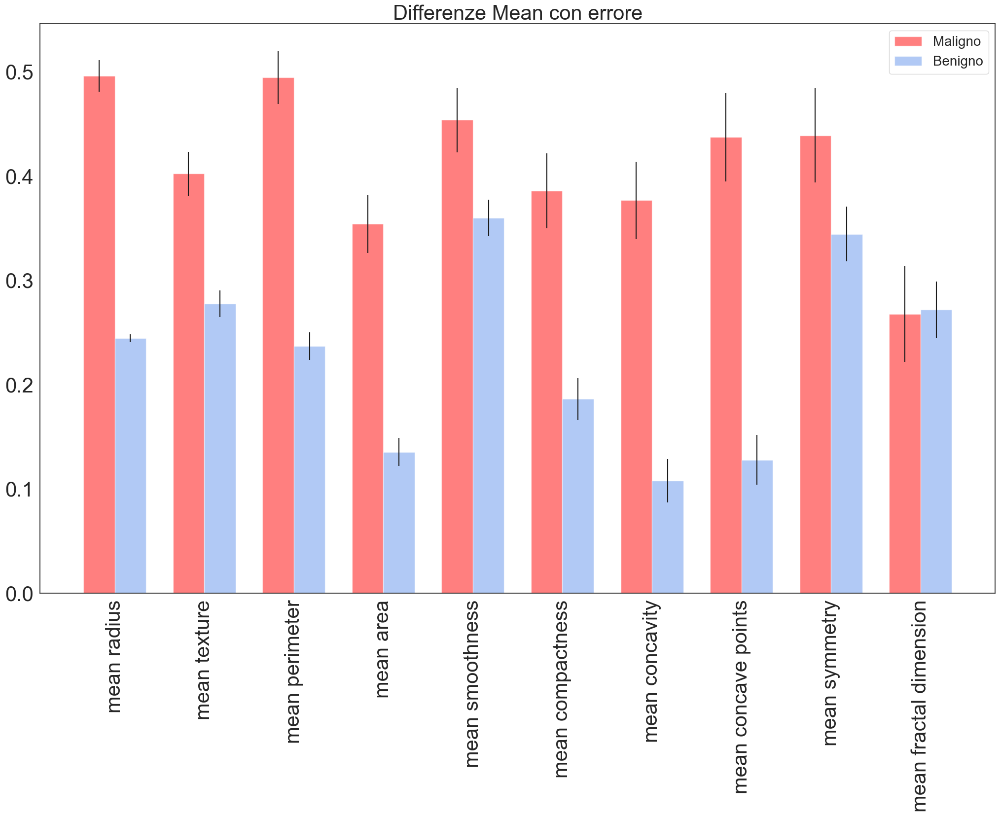

In [133]:
plt.rc('figure', figsize=(25.0, 15.0))

x = np.arange(len(labels_mean)) 
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, maligno_mean, width, yerr=mse_error_maligni_list, label='Maligno', alpha=0.5, color='red')
rects2 = ax.bar(x + width/2, benigno_mean, width, yerr=mse_error_benigni_list, label='Benigno', alpha=0.5, color='#6495ed')

ax.set_title('Differenze Mean con errore', size=30)
ax.set_xticks(x)
ax.set_xticklabels(labels_mean)
ax.legend()

plt.xticks(rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.legend(fontsize=20)

plt.show() 